**DOMAIN**: 
Electronics and Telecommunication

**CONTEXT**: 
A communications equipment manufacturing company has a product which is responsible for emitting informative signals. Company wants to build a machine learning model which can help the company to predict the equipment’s signal quality using various parameters. 

**DATA DESCRIPTION**: 
The data set contains information on various signal tests performed:

    1. Parameters: Various measurable signal parameters.
    2. Signal_Quality: Final signal strength or quality

**PROJECT OBJECTIVE**: 
The need is to build a regressor which can use these parameters to determine the signal strength or quality [as number].
Steps and tasks:
    
    1. Import data.
    2. Data analysis & visualisation
        • Perform relevant and detailed statistical analysis on the data.
        • Perform relevant and detailed uni, bi and multi variate analysis.
    
    Hint: Use your best analytical approach. Even you can mix match columns to create new columns which can be used for better analysis. Create your own features if required. Be highly experimental and analytical here to find relevant hidden patterns. 
    
    3. Design, train, tune and test a neural network regressor. 
    Hint: Use best approach to refine and tune the data or the model. Be highly experimental here.
    
    4. Pickle the model for future use

In [1]:
#Importing required libraries
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Activation, Dense
from tensorflow.keras.layers import BatchNormalization, Dropout
from tensorflow.keras import optimizers
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

import sklearn
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score

#### Task 1 :  Import data.

In [2]:
etRawFile = pd.read_csv("./Part- 1 - Signal.csv")

#### Task 2. Data analysis & visualisation
    • Perform relevant and detailed statistical analysis on the data.
    • Perform relevant and detailed uni, bi and multi variate analysis.

    Reading sample data

In [3]:
etRawFile.sample(3)

,Parameter 1,Parameter 2,Parameter 3,Parameter 4,Parameter 5,Parameter 6,Parameter 7,Parameter 8,Parameter 9,Parameter 10,Parameter 11,Signal_Strength
1529,7.1,0.69,0.08,2.1,0.063,42.0,52.0,0.99608,3.42,0.60,10.2,6
265,11.8,0.26,0.52,1.8,0.071,6.0,10.0,0.99680,3.20,0.72,10.2,7
1570,6.4,0.36,0.53,2.2,0.230,19.0,35.0,0.99340,3.37,0.93,12.4,6


    Checking data types and other information

In [4]:
#check the data types, size of dataframe in mem
etRawFile.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Parameter 1      1599 non-null   float64
 1   Parameter 2      1599 non-null   float64
 2   Parameter 3      1599 non-null   float64
 3   Parameter 4      1599 non-null   float64
 4   Parameter 5      1599 non-null   float64
 5   Parameter 6      1599 non-null   float64
 6   Parameter 7      1599 non-null   float64
 7   Parameter 8      1599 non-null   float64
 8   Parameter 9      1599 non-null   float64
 9   Parameter 10     1599 non-null   float64
 10  Parameter 11     1599 non-null   float64
 11  Signal_Strength  1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB


    View some basic statistical details like percentile, mean, std etc.

In [5]:
etRawFile.describe().T

,count,mean,std,min,25%,50%,75%,max
Parameter 1,1599.0,8.319637,1.741096,4.60000,7.1000,7.90000,9.200000,15.90000
Parameter 2,1599.0,0.527821,0.179060,0.12000,0.3900,0.52000,0.640000,1.58000
Parameter 3,1599.0,0.270976,0.194801,0.00000,0.0900,0.26000,0.420000,1.00000
Parameter 4,1599.0,2.538806,1.409928,0.90000,1.9000,2.20000,2.600000,15.50000
Parameter 5,1599.0,0.087467,0.047065,0.01200,0.0700,0.07900,0.090000,0.61100
Parameter 6,1599.0,15.874922,10.460157,1.00000,7.0000,14.00000,21.000000,72.00000
Parameter 7,1599.0,46.467792,32.895324,6.00000,22.0000,38.00000,62.000000,289.00000
Parameter 8,1599.0,0.996747,0.001887,0.99007,0.9956,0.99675,0.997835,1.00369
Parameter 9,1599.0,3.311113,0.154386,2.74000,3.2100,3.31000,3.400000,4.01000
Parameter 10,1599.0,0.658149,0.169507,0.33000,0.5500,0.62000,0.730000,2.00000


    Parameter 1:
         mean and median value are close by, so the data seems to be normally distributed. There is considerable difference between 75% and max, so there could be outiers. Need to check modality of the data.
    Parameter 2:
        mean and median values are close by, so the data seems to be normally distributed. There could be few outiers, we need to check data using boxplot. 
    Parameter 3:
        mean and median values are close by, so the data seems to be normally distributed. There could be few outiers, we need to check data using boxplot.
    Parameter 4:
        mean and median values are close by, so the data seems to be normally distributed. There is considerable difference between 75% and max, so there could be outiers.
    Parameter 5:
        mean and median values are close by, so the data seems to be normally distributed. There is considerable difference between 75% and max, so there could be outiers.
    Parameter 6:
        There is considerable difference between 75% and max, so there could be outiers. Need to check the distribution of data in kde plot.
    Parameter 7:
        There is considerable difference between 75% and max, so there could be outiers. Need to check the distribution of data in kde plot.
    Parameter 8:
         mean and median value are close by, so the data seems to be normally distributed. There is considerable difference between 75% and max, so there could be outiers.
    Parameter 9:
         mean and median value are close by, so the data seems to be normally distributed. There is considerable difference between 75% and max, so there could be outiers. 
    Parameter 10:
         mean and median value are close by, so the data seems to be normally distributed. There is considerable difference between 75% and max, so there could be outiers.

In [6]:
meanMedianComparison = etRawFile.describe().T[['mean','50%']]
meanMedianComparison['mean']-meanMedianComparison['50%']

Parameter 1        0.419637
Parameter 2        0.007821
Parameter 3        0.010976
Parameter 4        0.338806
Parameter 5        0.008467
Parameter 6        1.874922
Parameter 7        8.467792
Parameter 8       -0.000003
Parameter 9        0.001113
Parameter 10       0.038149
Parameter 11       0.222983
Signal_Strength   -0.363977
dtype: float64

    Above table would give insight into data about distribution of mean and median for each column.

In [7]:
#check if the values are null
etRawFile.isnull().sum()

Parameter 1        0
Parameter 2        0
Parameter 3        0
Parameter 4        0
Parameter 5        0
Parameter 6        0
Parameter 7        0
Parameter 8        0
Parameter 9        0
Parameter 10       0
Parameter 11       0
Signal_Strength    0
dtype: int64

    There are no null values observed in the above cell output, so no need to null value correction.

    Univariate data analysis is done below.

D:\anaconda\envs\gl\lib\site-packages\ipykernel_launcher.py:14: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  


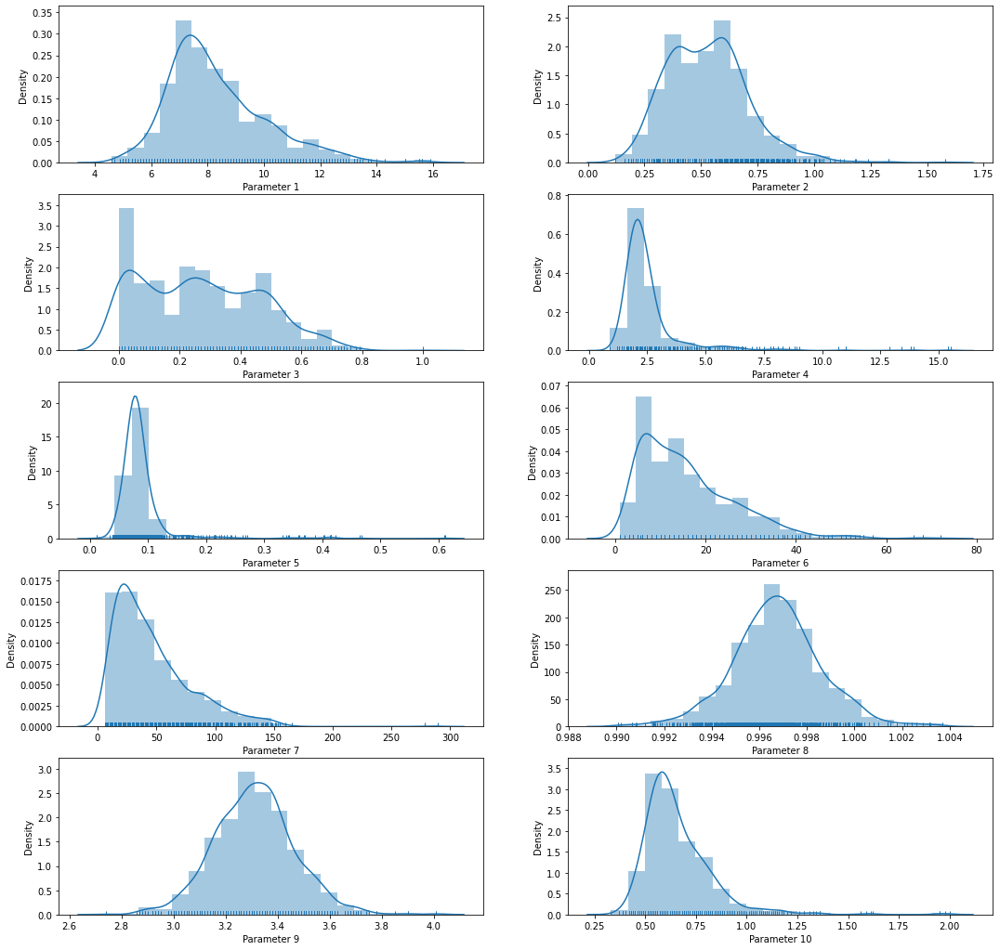

In [8]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

fig, ax = plt.subplots(5,2, figsize=(18,18))
listOfColumns = etRawFile.columns[:10]
len_listOfColumns = len(listOfColumns)
index = 0

for j in range(len(ax)):
    for i in range(len(ax[j])):
        if(index < len_listOfColumns):
            ax[j][i] = sns.distplot(etRawFile[listOfColumns[index]],bins=20,rug=True,ax = ax[j][i]);            
            index = index + 1 
fig.show()

    As seen in above diagram, most columns are having normal distribution of data. There are modality obsereved in parameter 3 and parameter 2 column.
    Long tail observed for Parameter 4, Parameter 5,Parameter 6, Parameter 7 and Parameter 10 and can be considered as right skewed data distribution. For these column we need to check outliers and treat them as required.

    Viewing data in boxplot would help to identify the outliers.

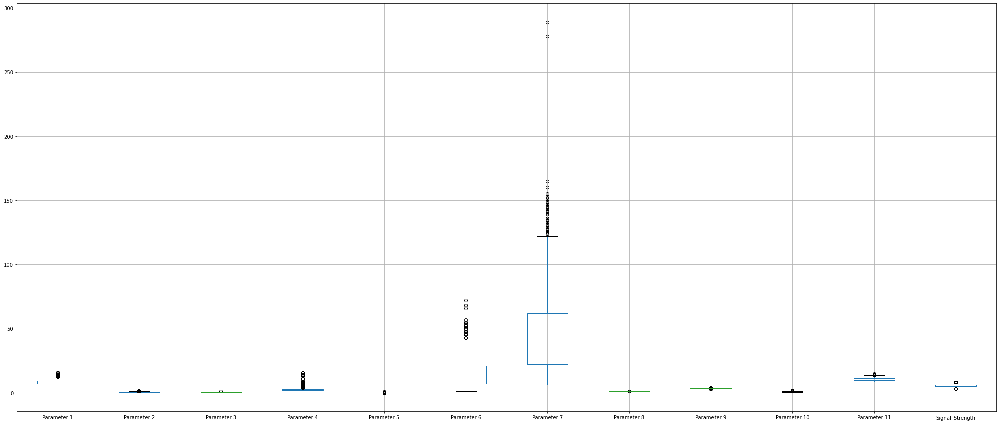

In [9]:
etRawFile.boxplot(figsize=(35,15));

    Since there are outliers observed on many column, let's see the data in detail box plot for individual columns.

D:\anaconda\envs\gl\lib\site-packages\ipykernel_launcher.py:15: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  from ipykernel import kernelapp as app


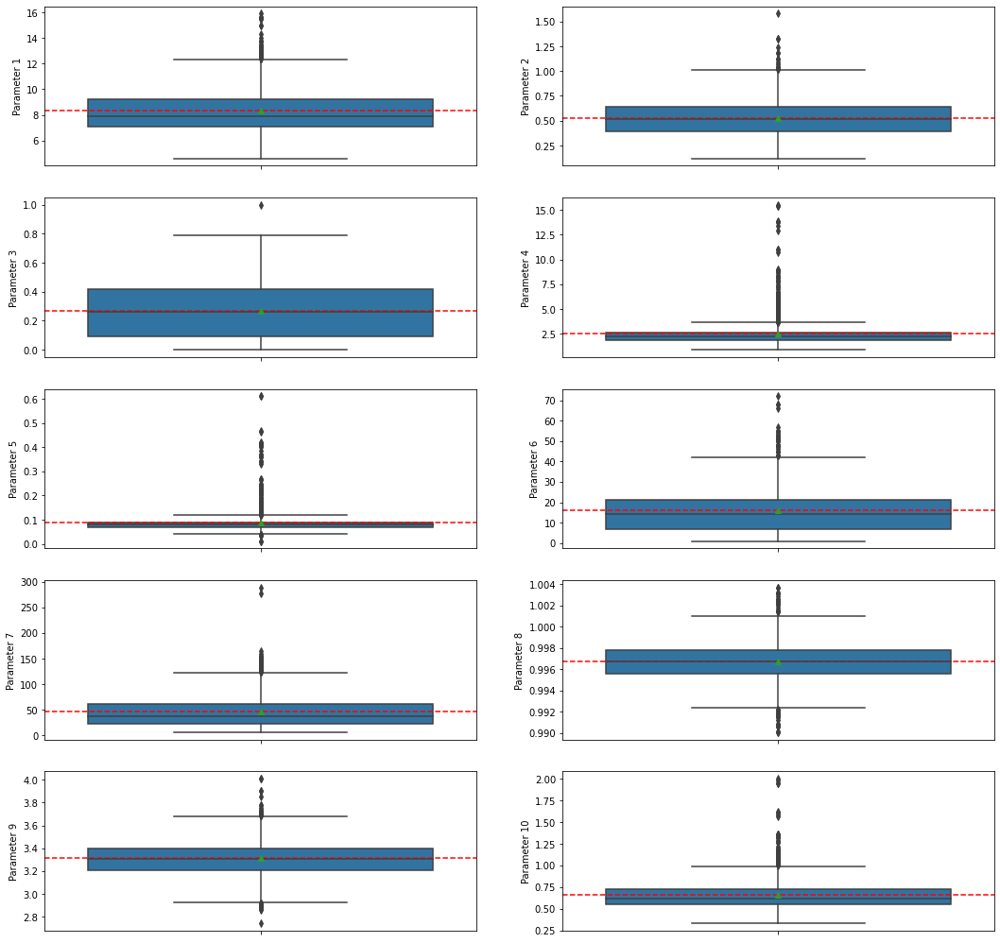

In [10]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

fig, ax = plt.subplots(5,2, figsize=(18,18))
listOfColumns = etRawFile.columns[:10]
len_listOfColumns = len(listOfColumns)
index = 0

for j in range(len(ax)):
    for i in range(len(ax[j])):
        if(index < len_listOfColumns):
            ax[j][i] = sns.boxplot(y=etRawFile[listOfColumns[index]],showmeans=True, ax = ax[j][i]);
            ax[j][i].axhline(etRawFile[listOfColumns[index]].mean(),color = 'r', ls='--')
            index = index + 1 
fig.show()

    There are outliers observed in every column which are outiers of 1.5*IQR. We shall run our final model on both outlier treated data and the one without treating it and observe the output. 
    
    Azme Khamis, Zuhaimy Ismail , Khalid Haron and Ahmad Tarmizi Mohammed , 2005. The Effects of Outliers Data on Neural Network Performance. Journal of Applied Sciences, 5: 1394-1398.

    DOI: 10.3923/jas.2005.1394.1398

In [11]:
dfO = etRawFile.iloc[:,:-1]
Q1 = dfO.quantile(0.25)
Q3 = dfO.quantile(0.75)
IQR = Q3 - Q1
perOfOutliers = ((((dfO < (Q1 - 1.5 * IQR)) | (dfO > (Q3 + 1.5 * IQR))).sum())/dfO.shape[0]*100).to_frame()

In [12]:
perOfOutliers

,0
Parameter 1,3.064415
Parameter 2,1.188243
Parameter 3,0.062539
Parameter 4,9.693558
Parameter 5,7.004378
Parameter 6,1.876173
Parameter 7,3.439650
Parameter 8,2.814259
Parameter 9,2.188868
Parameter 10,3.689806


    Percentage of outliers are very less, so we observe that these may not affect the output of Neural network

In [13]:
print("Count of outliers ::\n", ((dfO < (Q1 - 1.5 * IQR)) | (dfO > (Q3 + 1.5 * IQR))).sum())

Count of outliers ::
 Parameter 1      49
Parameter 2      19
Parameter 3       1
Parameter 4     155
Parameter 5     112
Parameter 6      30
Parameter 7      55
Parameter 8      45
Parameter 9      35
Parameter 10     59
Parameter 11     13
dtype: int64


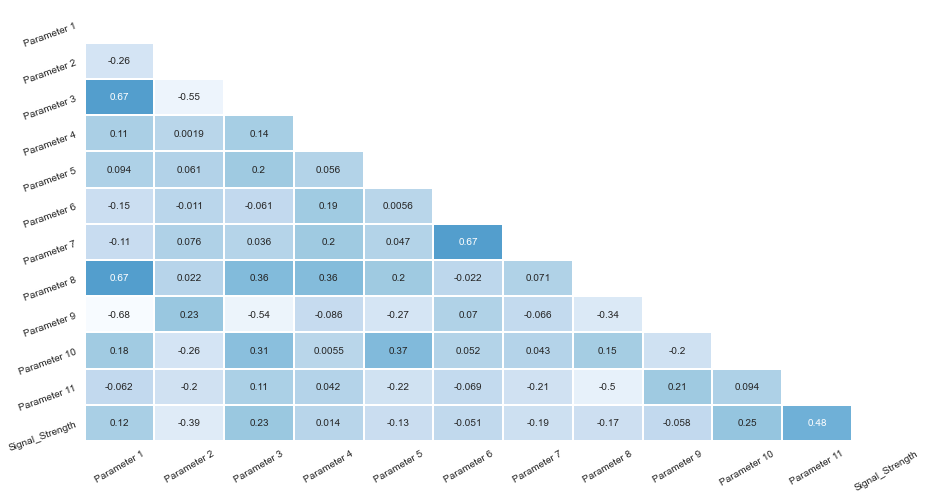

In [14]:



#Correlation Matrix
df = etRawFile
corr = df.corr() # correlation matrix
lower_triangle = np.tril(corr, k = -1) 
mask = lower_triangle == 0  # to mask the upper triangle in the following heatmap

plt.figure(figsize = (15,8)) 
sns.set_style(style = 'white')  # Setting it to white so that we do not see the grid lines
sns.heatmap(lower_triangle, center=0.5, cmap= 'Blues', annot= True, xticklabels = corr.index, yticklabels = corr.columns, cbar= False, linewidths= 1, mask = mask)  
plt.xticks(rotation = 30)   
plt.yticks(rotation = 20) 
plt.show()

    As observed the correlation between any 2 variable is not strong (here more than 85 % can be considered as strong), so there is no need to delete any columns.

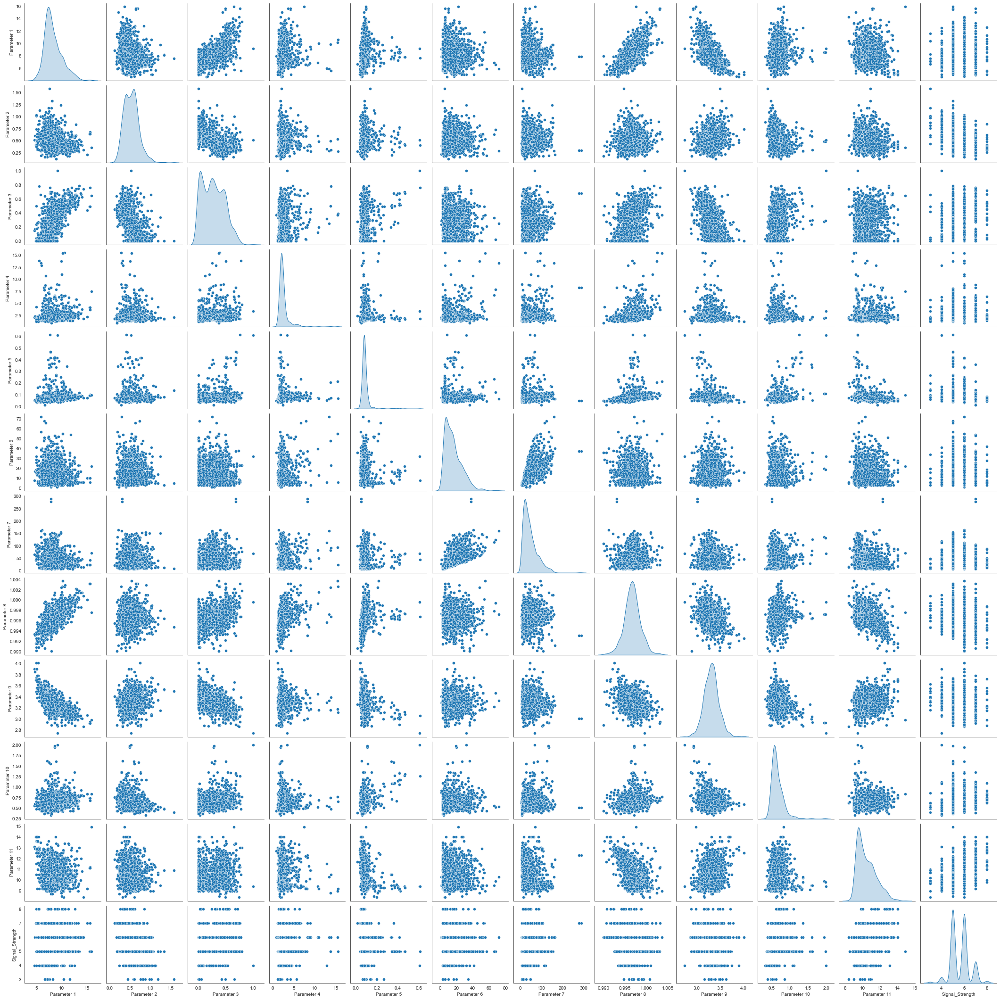

In [15]:

g = sns.pairplot(etRawFile, diag_kind='kde')

D:\anaconda\envs\gl\lib\site-packages\seaborn\distributions.py:1185: UserWarning: No contour levels were found within the data range.
  **contour_kws,
D:\anaconda\envs\gl\lib\site-packages\seaborn\distributions.py:1185: UserWarning: No contour levels were found within the data range.
  **contour_kws,
D:\anaconda\envs\gl\lib\site-packages\seaborn\distributions.py:1185: UserWarning: No contour levels were found within the data range.
  **contour_kws,
D:\anaconda\envs\gl\lib\site-packages\seaborn\distributions.py:1185: UserWarning: No contour levels were found within the data range.
  **contour_kws,
D:\anaconda\envs\gl\lib\site-packages\seaborn\distributions.py:1185: UserWarning: No contour levels were found within the data range.
  **contour_kws,
D:\anaconda\envs\gl\lib\site-packages\seaborn\distributions.py:1185: UserWarning: No contour levels were found within the data range.
  **contour_kws,
D:\anaconda\envs\gl\lib\site-packages\seaborn\distributions.py:1185: UserWarning: No contour l

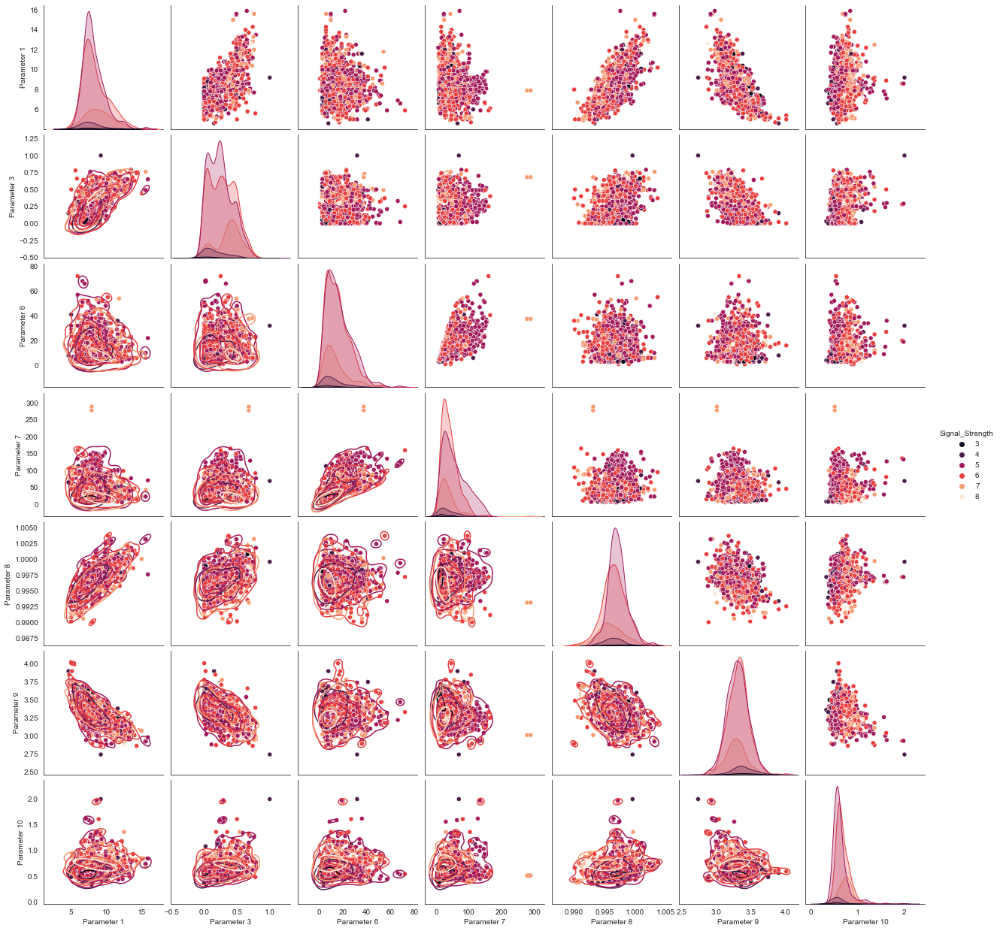

In [16]:


g = sns.pairplot(etRawFile
             ,diag_kind='kde'
             ,hue = 'Signal_Strength'
             ,palette = 'rocket' # #69d
             ,vars=['Parameter 1','Parameter 3','Parameter 6','Parameter 7','Parameter 8','Parameter 9','Parameter 10']
             )
g.map_lower(sns.kdeplot, levels=4, color=".2")

    Observing above graphs, we can see how the density distribution of the data. Paremeter 4,5,6 have denser concentration of data. These columns could be drivers of the regression. As we see in kde, the data points seems to give good variety of the data.

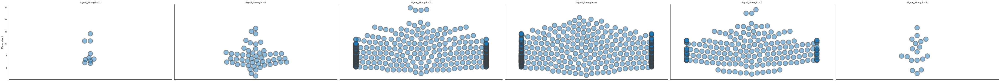

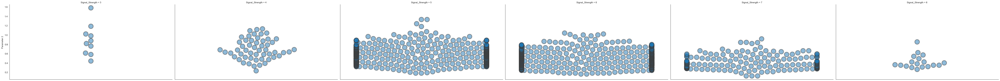

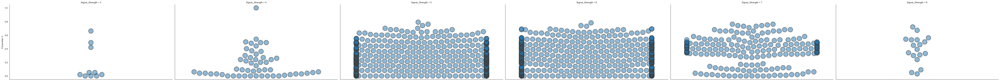

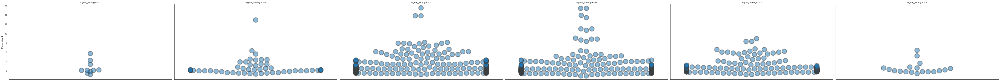

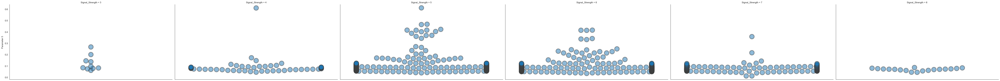

...

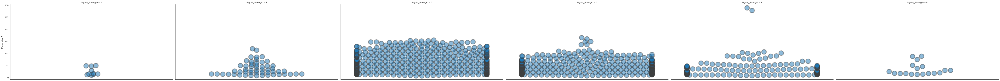

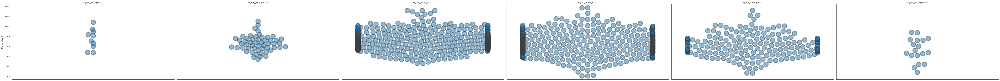

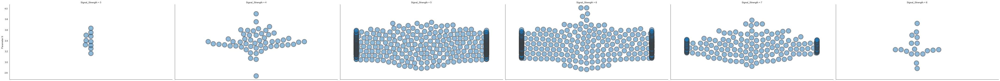

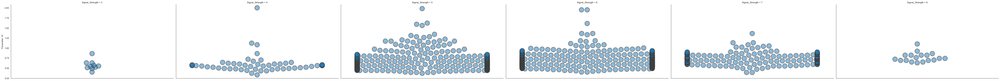

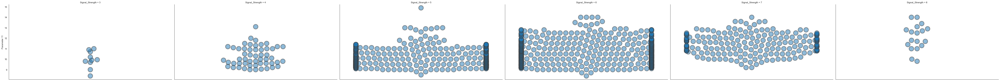

In [17]:

import warnings
warnings.simplefilter("ignore", UserWarning)


# etRawFile.columns
for i in ['Parameter 1', 'Parameter 2', 'Parameter 3', 'Parameter 4',
       'Parameter 5', 'Parameter 6', 'Parameter 7', 'Parameter 8',
       'Parameter 9', 'Parameter 10', 'Parameter 11']:
    g = sns.catplot(#x="Signal_Strength",
                        y = i ,
                        col="Signal_Strength",
                        data=etRawFile, height=5, aspect=2,
                        s=20,alpha=0.5, linewidth=3, 
                        kind="swarm"
                );
    g.set_xticklabels(rotation=30);

    In above graphs, we can observe that the data distribution is having wide range for signal strength - 5,6,7.
    For other 3 types of signal strength, the data distribution is slim. 
    Although this is a regression problem and Signal strength is considered as a continous variable, there are only few values for signal strength. These signal strength if we consider them as a categorical column for time being, the above graph gives some insight into data.

    Making copy of the raw file, which will be used for netwok training.

In [18]:
etRawFileOutliersRemoved = etRawFile.copy()

In [19]:
#find the outliers and replace them by median
for col_name in etRawFile.columns[:-1]:
    q1 = etRawFile[col_name].quantile(0.25)
    q3 = etRawFile[col_name].quantile(0.75)
    iqr = q3 - q1
    
    low = q1-1.5*iqr
    high = q3+1.5*iqr
    
    etRawFileOutliersRemoved.loc[(etRawFileOutliersRemoved[col_name] < low) | (etRawFileOutliersRemoved[col_name] > high), col_name] = etRawFileOutliersRemoved[col_name].median()

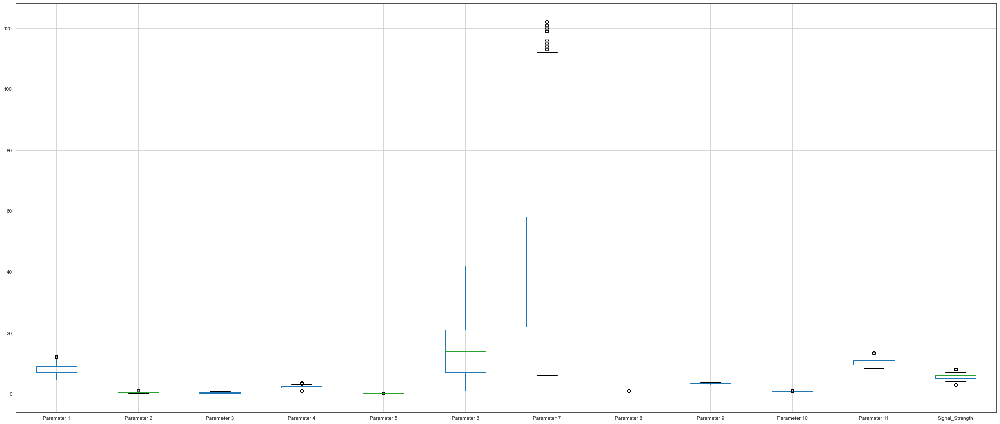

In [20]:
etRawFileOutliersRemoved.boxplot(figsize=(35,15));

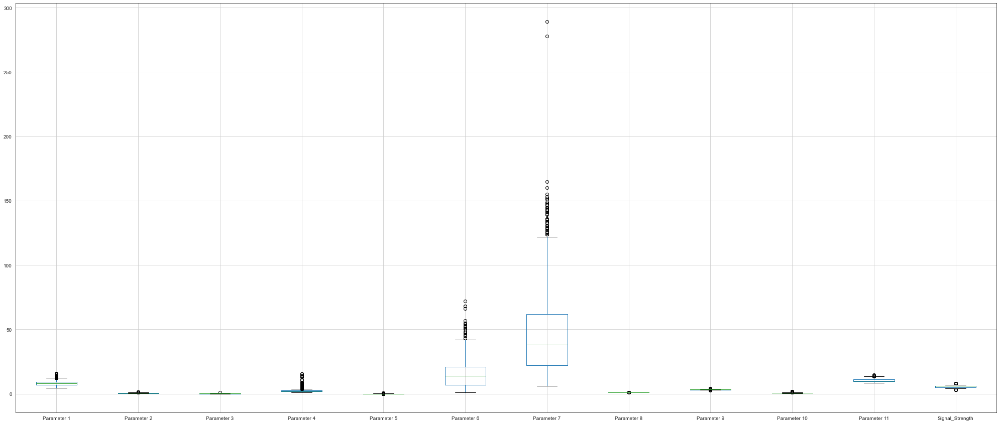

In [21]:
etRawFile.boxplot(figsize=(35,15));

    As we can observe, the outliers are reduced in the etRawFileOutliersRemoved dataset. We shall use this in the network to see if outlier are affecting the performance.

    Preparing dataset for training the network

###### Design, train, tune and test a neural network regressor. 

In [22]:
#getting the features of the dataset
etFeatures=etRawFile.iloc[:,:-1].values

In [23]:
#getting the target value of the dataset
etActualSignal = etRawFile.iloc[:,-1].values

In [24]:
print('Number of examples: ', etFeatures.shape[0])
print('Number of features for each example: ', etFeatures.shape[1])
print('Shape of actual prices data: ', etActualSignal.shape)

Number of examples:  1599
Number of features for each example:  11
Shape of actual prices data:  (1599,)


In [25]:
X_train_Features, X_test_Features, y_train_ActualSignal, y_test_ActualSignal = train_test_split(etFeatures,etActualSignal, test_size=0.2, random_state=42)

In [26]:
print('Number of Train examples: ', X_train_Features.shape[0])
print('Number of Train features for each example: ', X_train_Features.shape[1])
print('Shape of Train actual prices data: ', y_train_ActualSignal.shape)
print('Number of Test examples: ', X_test_Features.shape[0])
print('Number of Test features for each example: ', X_test_Features.shape[1])
print('Shape of Test actual prices data: ', y_test_ActualSignal.shape)

Number of Train examples:  1279
Number of Train features for each example:  11
Shape of Train actual prices data:  (1279,)
Number of Test examples:  320
Number of Test features for each example:  11
Shape of Test actual prices data:  (320,)


In [27]:
X_train_Features[:5]

array([[8.7000e+00, 6.9000e-01, 3.1000e-01, 3.0000e+00, 8.6000e-02,
        2.3000e+01, 8.1000e+01, 1.0002e+00, 3.4800e+00, 7.4000e-01,
        1.1600e+01],
       [6.1000e+00, 2.1000e-01, 4.0000e-01, 1.4000e+00, 6.6000e-02,
        4.0500e+01, 1.6500e+02, 9.9120e-01, 3.2500e+00, 5.9000e-01,
        1.1900e+01],
       [1.0900e+01, 3.9000e-01, 4.7000e-01, 1.8000e+00, 1.1800e-01,
        6.0000e+00, 1.4000e+01, 9.9820e-01, 3.3000e+00, 7.5000e-01,
        9.8000e+00],
       [8.8000e+00, 6.8500e-01, 2.6000e-01, 1.6000e+00, 8.8000e-02,
        1.6000e+01, 2.3000e+01, 9.9694e-01, 3.3200e+00, 4.7000e-01,
        9.4000e+00],
       [8.4000e+00, 1.0350e+00, 1.5000e-01, 6.0000e+00, 7.3000e-02,
        1.1000e+01, 5.4000e+01, 9.9900e-01, 3.3700e+00, 4.9000e-01,
        9.9000e+00]])

In [28]:
y_train_ActualSignal[:5]

array([6, 6, 6, 5, 5], dtype=int64)

In [29]:
#getting the features of the dataset
etRawFileOutliersRemovedFeatures = etRawFileOutliersRemoved.iloc[:,:-1].values

In [30]:
#getting the target value of the dataset
etRawFileOutliersRemovedActualSignal = etRawFileOutliersRemoved.iloc[:,-1].values

In [31]:
print('Number of examples: ', etRawFileOutliersRemovedFeatures.shape[0])
print('Number of features for each example: ', etRawFileOutliersRemovedFeatures.shape[1])
print('Shape of actual prices data: ', etRawFileOutliersRemovedActualSignal.shape)

Number of examples:  1599
Number of features for each example:  11
Shape of actual prices data:  (1599,)


In [32]:
X_train_OutliersRemovedFeatures, X_test_OutliersRemovedFeatures, y_train_OutliersRemovedActualSignal, y_test_OutliersRemovedActualSignal = train_test_split(etRawFileOutliersRemovedFeatures,etRawFileOutliersRemovedActualSignal, test_size=0.2, random_state=42)

In [33]:
print('Number of Train examples: ', X_train_OutliersRemovedFeatures.shape[0])
print('Number of Train features for each example: ', X_train_OutliersRemovedFeatures.shape[1])
print('Shape of Train actual prices data: ', y_train_OutliersRemovedActualSignal.shape)
print('Number of Test examples: ', X_test_OutliersRemovedFeatures.shape[0])
print('Number of Test features for each example: ', X_test_OutliersRemovedFeatures.shape[1])
print('Shape of Test actual prices data: ', y_test_OutliersRemovedActualSignal.shape)

Number of Train examples:  1279
Number of Train features for each example:  11
Shape of Train actual prices data:  (1279,)
Number of Test examples:  320
Number of Test features for each example:  11
Shape of Test actual prices data:  (320,)


In [34]:
X_train_OutliersRemovedFeatures[:5]

array([[8.7000e+00, 6.9000e-01, 3.1000e-01, 3.0000e+00, 8.6000e-02,
        2.3000e+01, 8.1000e+01, 1.0002e+00, 3.4800e+00, 7.4000e-01,
        1.1600e+01],
       [6.1000e+00, 2.1000e-01, 4.0000e-01, 1.4000e+00, 6.6000e-02,
        4.0500e+01, 3.8000e+01, 9.9675e-01, 3.2500e+00, 5.9000e-01,
        1.1900e+01],
       [1.0900e+01, 3.9000e-01, 4.7000e-01, 1.8000e+00, 1.1800e-01,
        6.0000e+00, 1.4000e+01, 9.9820e-01, 3.3000e+00, 7.5000e-01,
        9.8000e+00],
       [8.8000e+00, 6.8500e-01, 2.6000e-01, 1.6000e+00, 8.8000e-02,
        1.6000e+01, 2.3000e+01, 9.9694e-01, 3.3200e+00, 4.7000e-01,
        9.4000e+00],
       [8.4000e+00, 5.2000e-01, 1.5000e-01, 2.2000e+00, 7.3000e-02,
        1.1000e+01, 5.4000e+01, 9.9900e-01, 3.3700e+00, 4.9000e-01,
        9.9000e+00]])

In [35]:
y_train_OutliersRemovedActualSignal[:5]

array([6, 6, 6, 5, 5], dtype=int64)

    Training a simple network to see if we are able to find the proper regression, we shall observe the results and decide further development of the network.

In [36]:
def simple_ET_model():
    # Initialize Sequential model
    model = tf.keras.models.Sequential()
    
    # Normalize input data
    model.add(tf.keras.layers.BatchNormalization(input_shape=(11,)))
    
    # Add final Dense layer for prediction - Tensorflow.keras declares weights and bias automatically
    model.add(tf.keras.layers.Dense(1, kernel_initializer='normal',activation='relu'))
    
    # Compile the model - add mean squared error as loss and stochastic gradient descent as optimizer
    model.compile(optimizer='adam', loss='mse')
    
    return model

In [37]:
simple_model = simple_ET_model()
simple_model.fit(X_train_Features, y_train_ActualSignal, epochs=150, validation_split=0.35)

Epoch 1/150
26/26 [==============================] - 2s 14ms/step - loss: 31.2001 - val_loss: 23.0700
Epoch 2/150
26/26 [==============================] - 0s 3ms/step - loss: 30.4982 - val_loss: 22.4391
Epoch 3/150
26/26 [==============================] - 0s 3ms/step - loss: 29.6616 - val_loss: 21.9168
Epoch 4/150
26/26 [==============================] - 0s 4ms/step - loss: 28.6117 - val_loss: 21.2689
Epoch 5/150
26/26 [==============================] - 0s 3ms/step - loss: 27.4081 - val_loss: 20.3311
Epoch 6/150
26/26 [==============================] - 0s 3ms/step - loss: 26.0620 - val_loss: 19.3179
Epoch 7/150
26/26 [==============================] - 0s 5ms/step - loss: 24.4931 - val_loss: 18.1007
Epoch 8/150
26/26 [==============================] - 0s 3ms/step - loss: 22.8482 - val_loss: 16.7526
Epoch 9/150
26/26 [==============================] - 0s 4ms/step - loss: 21.0677 - val_loss: 15.3852
Epoch 10/150
26/26 [==============================] - 0s 3ms/step - loss: 19.3125 - val_lo

    In above model, the loss seems to be more, so we need to tune the model.

Lets change the network and add 1 more layer and change the loss function to see if we are seeing any imporvement in the results.
Below cell has code with **Outlier** dataset

In [38]:
# Initialize Sequential model
model = tf.keras.models.Sequential()

# Normalize input data
model.add(tf.keras.layers.BatchNormalization(input_shape=(11,)))

# The Hidden Layers :  Even with only one dense layer, it is observed that performance enhanced drastically.
model.add(Dense(64, kernel_initializer='normal',activation='relu'))
# model.add(Dense(64, kernel_initializer='normal',activation='relu'))
# model.add(Dense(64, kernel_initializer='normal',activation='relu'))

# The Output Layer :
model.add(Dense(1, kernel_initializer='normal',activation='relu'))


Huber = tf.keras.losses.Huber()
# l = tensorflow.keras.losses.LogCosh()
# h = tensorflow.keras.losses.CategoricalHinge()
# mae = tensorflow.keras.losses.MeanAbsoluteError()
# mse = tensorflow.keras.losses.MeanSquaredError()

optimizers = tf.keras.optimizers.Adam(learning_rate=0.001)

# Compile the model - add mean squared error as loss and stochastic gradient descent as optimizer
model.compile(optimizer=optimizers, loss=Huber)
history = model.fit(X_train_Features, y_train_ActualSignal, epochs=100, validation_split=0.35,
                    batch_size = 32)

Epoch 1/100
26/26 [==============================] - 1s 10ms/step - loss: 5.0689 - val_loss: 4.7124
Epoch 2/100
26/26 [==============================] - 0s 3ms/step - loss: 4.7838 - val_loss: 4.1261
Epoch 3/100
26/26 [==============================] - 0s 3ms/step - loss: 4.2326 - val_loss: 3.5485
Epoch 4/100
26/26 [==============================] - 0s 3ms/step - loss: 3.2623 - val_loss: 2.8534
Epoch 5/100
26/26 [==============================] - 0s 3ms/step - loss: 1.8733 - val_loss: 2.1005
Epoch 6/100
26/26 [==============================] - 0s 3ms/step - loss: 1.0854 - val_loss: 1.5237
Epoch 7/100
26/26 [==============================] - 0s 3ms/step - loss: 0.8255 - val_loss: 1.2585
Epoch 8/100
26/26 [==============================] - 0s 3ms/step - loss: 0.6898 - val_loss: 1.1263
Epoch 9/100
26/26 [==============================] - 0s 3ms/step - loss: 0.5911 - val_loss: 1.0435
Epoch 10/100
26/26 [==============================] - 0s 3ms/step - loss: 0.5513 - val_loss: 0.9488
Epoch 11

26/26 [==============================] - 0s 3ms/step - loss: 0.1839 - val_loss: 0.1923
Epoch 84/100
26/26 [==============================] - 0s 2ms/step - loss: 0.1783 - val_loss: 0.1928
Epoch 85/100
26/26 [==============================] - 0s 3ms/step - loss: 0.1806 - val_loss: 0.1919
Epoch 86/100
26/26 [==============================] - 0s 3ms/step - loss: 0.1793 - val_loss: 0.1937
Epoch 87/100
26/26 [==============================] - 0s 3ms/step - loss: 0.1782 - val_loss: 0.1915
Epoch 88/100
26/26 [==============================] - 0s 3ms/step - loss: 0.1774 - val_loss: 0.1915
Epoch 89/100
26/26 [==============================] - 0s 3ms/step - loss: 0.1765 - val_loss: 0.1980
Epoch 90/100
26/26 [==============================] - 0s 3ms/step - loss: 0.1758 - val_loss: 0.1906
Epoch 91/100
26/26 [==============================] - 0s 3ms/step - loss: 0.1727 - val_loss: 0.1947
Epoch 92/100
26/26 [==============================] - 0s 3ms/step - loss: 0.1794 - val_loss: 0.1956
Epoch 93/100


In [39]:
def ET_model():
    # Initialize Sequential model
    model = tf.keras.models.Sequential()
    
    # Normalize input data
    model.add(tf.keras.layers.BatchNormalization(input_shape=(11,)))
    
    # The Hidden Layers : Even with only one dense layer, it is observed that performance enhanced drastically.
    model.add(Dense(64, kernel_initializer='normal',activation='relu'))
    # model.add(Dense(64, kernel_initializer='normal',activation='relu'))
    # model.add(Dense(64, kernel_initializer='normal',activation='relu'))
    
    # The Output Layer :
    model.add(Dense(1, kernel_initializer='normal',activation='relu'))
    
    
    #There are several loss function which has been tried, among these Huber performance is good and hence using it.
    Huber = tf.keras.losses.Huber()
    # l = tensorflow.keras.losses.LogCosh()
    # h = tensorflow.keras.losses.CategoricalHinge()
    # mae = tensorflow.keras.losses.MeanAbsoluteError()
    # mse = tensorflow.keras.losses.MeanSquaredError()
    
    #Among optimizers Adam optimizer was provide good performance.
    optimizers = tf.keras.optimizers.Adam(learning_rate=0.001)
    
    # Compile the model - add mean squared error as loss and stochastic gradient descent as optimizer
    model.compile(optimizer=optimizers, loss=Huber)
    
    return model

model1 = ET_model()
history = model1.fit(X_train_Features, y_train_ActualSignal, epochs=100, validation_split=0.35,
                    batch_size = 32)

Epoch 1/100
26/26 [==============================] - 1s 9ms/step - loss: 5.0538 - val_loss: 4.8085
Epoch 2/100
26/26 [==============================] - 0s 5ms/step - loss: 4.7777 - val_loss: 4.4154
Epoch 3/100
26/26 [==============================] - 0s 3ms/step - loss: 4.2641 - val_loss: 3.9726
Epoch 4/100
26/26 [==============================] - 0s 5ms/step - loss: 3.3038 - val_loss: 3.3154
Epoch 5/100
26/26 [==============================] - 0s 4ms/step - loss: 1.9934 - val_loss: 2.3182
Epoch 6/100
26/26 [==============================] - 0s 4ms/step - loss: 1.2401 - val_loss: 1.3362
Epoch 7/100
26/26 [==============================] - 0s 4ms/step - loss: 0.9135 - val_loss: 0.8436
Epoch 8/100
26/26 [==============================] - 0s 4ms/step - loss: 0.7344 - val_loss: 0.6545
Epoch 9/100
26/26 [==============================] - 0s 4ms/step - loss: 0.6301 - val_loss: 0.5675
Epoch 10/100
26/26 [==============================] - 0s 4ms/step - loss: 0.5340 - val_loss: 0.5062
Epoch 11/

26/26 [==============================] - 0s 3ms/step - loss: 0.1814 - val_loss: 0.1901
Epoch 84/100
26/26 [==============================] - 0s 3ms/step - loss: 0.1748 - val_loss: 0.1911
Epoch 85/100
26/26 [==============================] - 0s 3ms/step - loss: 0.1785 - val_loss: 0.1861
Epoch 86/100
26/26 [==============================] - 0s 3ms/step - loss: 0.1710 - val_loss: 0.1897
Epoch 87/100
26/26 [==============================] - 0s 3ms/step - loss: 0.1792 - val_loss: 0.1862
Epoch 88/100
26/26 [==============================] - 0s 3ms/step - loss: 0.1810 - val_loss: 0.1895
Epoch 89/100
26/26 [==============================] - 0s 3ms/step - loss: 0.1760 - val_loss: 0.1888
Epoch 90/100
26/26 [==============================] - 0s 5ms/step - loss: 0.1797 - val_loss: 0.1871
Epoch 91/100
26/26 [==============================] - 0s 5ms/step - loss: 0.1714 - val_loss: 0.1884
Epoch 92/100
26/26 [==============================] - 0s 5ms/step - loss: 0.1735 - val_loss: 0.1858
Epoch 93/100


- Even with only one dense hidden layer, it is observed that performance enhanced drastically and hence adding it. Adding more dense layer is not improving performance and hence commented. Adding Batch normilization in between layer was benefical only between first and second layer, subsequent addition were not so benifical.
- There are several loss function which has been tried, among these Huber performance is good and hence using it.  the Huber loss is a loss function used in robust regression, that is less sensitive to outliers in data than the squared error loss. Huber loss can be really helpful in such cases, as it curves around the minima which decreases the gradient. And it’s more robust to outliers than MSE. Therefore, it combines good properties from both MSE and MAE. 
- Among optimizers Adam optimizer was provide good performance.
     
     Reference : 
     
     https://www.analyticsvidhya.com/blog/2021/05/guide-for-loss-function-in-tensorflow/
     
     https://keras.io/api/optimizers/

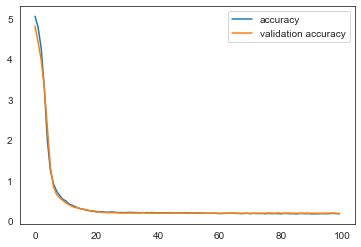

In [40]:
# plot the model accuracy and validation accuracy
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['accuracy','validation accuracy'])

    The above graph gives good insight into data, it shows that it is a good fit network.
    A good fit exists between an overfit and underfit model. There is minimal gap between the two final loss values.
    There is slight  generalization gap observed in the above graph

Below cell has code with **Outlier removed** dataset

In [41]:
modelOutliersRemoved = ET_model()
history = modelOutliersRemoved.fit(
                    X_train_OutliersRemovedFeatures
                    ,y_train_OutliersRemovedActualSignal
                    ,epochs=100
                    ,validation_split=0.35
                    ,batch_size = 32)

Epoch 1/100
26/26 [==============================] - 1s 9ms/step - loss: 4.9942 - val_loss: 4.2096
Epoch 2/100
26/26 [==============================] - 0s 4ms/step - loss: 4.6653 - val_loss: 3.4615
Epoch 3/100
26/26 [==============================] - 0s 3ms/step - loss: 4.0741 - val_loss: 2.3214
Epoch 4/100
26/26 [==============================] - 0s 3ms/step - loss: 3.0286 - val_loss: 0.7964
Epoch 5/100
26/26 [==============================] - 0s 3ms/step - loss: 1.6074 - val_loss: 0.7518
Epoch 6/100
26/26 [==============================] - 0s 3ms/step - loss: 0.9393 - val_loss: 0.7920
Epoch 7/100
26/26 [==============================] - 0s 3ms/step - loss: 0.7650 - val_loss: 0.4556
Epoch 8/100
26/26 [==============================] - 0s 4ms/step - loss: 0.6742 - val_loss: 0.3785
Epoch 9/100
26/26 [==============================] - 0s 3ms/step - loss: 0.5969 - val_loss: 0.3484
Epoch 10/100
26/26 [==============================] - 0s 3ms/step - loss: 0.5198 - val_loss: 0.3325
Epoch 11/

26/26 [==============================] - 0s 4ms/step - loss: 0.1805 - val_loss: 0.1872
Epoch 84/100
26/26 [==============================] - 0s 4ms/step - loss: 0.1796 - val_loss: 0.1877
Epoch 85/100
26/26 [==============================] - 0s 4ms/step - loss: 0.1801 - val_loss: 0.1869
Epoch 86/100
26/26 [==============================] - 0s 4ms/step - loss: 0.1790 - val_loss: 0.1845
Epoch 87/100
26/26 [==============================] - 0s 4ms/step - loss: 0.1738 - val_loss: 0.1874
Epoch 88/100
26/26 [==============================] - 0s 4ms/step - loss: 0.1728 - val_loss: 0.1883
Epoch 89/100
26/26 [==============================] - 0s 4ms/step - loss: 0.1807 - val_loss: 0.1868
Epoch 90/100
26/26 [==============================] - 0s 4ms/step - loss: 0.1772 - val_loss: 0.1917
Epoch 91/100
26/26 [==============================] - 0s 3ms/step - loss: 0.1767 - val_loss: 0.1856
Epoch 92/100
26/26 [==============================] - 0s 4ms/step - loss: 0.1746 - val_loss: 0.1870
Epoch 93/100


###### 4. Pickle the model for future use

In [42]:
modelOutliersRemoved.save("EAndCRegressor")

INFO:tensorflow:Assets written to: EAndCRegressor\assets


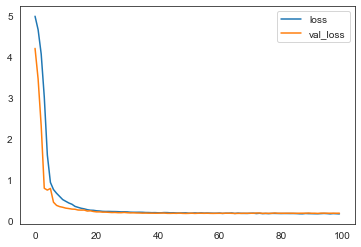

In [43]:
# plot the model accuracy and validation accuracy
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['loss','val_loss'])

    The above graph gives good insight into data, it shows that it is a good fit network.
    A good fit exists between an overfit and underfit model. There is minimal gap between the two final loss values.
    There is slight  generalization gap observed in the above graph

    calculating the score to evaluate the model
    Using earlier picked model to evaluate.

In [44]:
from sklearn.metrics import mean_squared_error

# It can be used to reconstruct the model identically.
reconstructed_model = tf.keras.models.load_model("EAndCRegressor")

y_train_pred = reconstructed_model.predict(X_train_OutliersRemovedFeatures)
y_test_pred = reconstructed_model.predict(X_test_OutliersRemovedFeatures)

print("The R2 score on the Train set is:\t{:0.3f}".format(r2_score(y_train_OutliersRemovedActualSignal, y_train_pred)))
print("The R2 score on the Test set is:\t{:0.3f}".format(r2_score(y_test_OutliersRemovedActualSignal, y_test_pred )))

The R2 score on the Train set is:	0.443
The R2 score on the Test set is:	0.380


    Lets check the difference in output of the test dataset so we can conclude on the performance of the trained model

In [45]:
dfOP1 = pd.DataFrame(y_test_OutliersRemovedActualSignal, columns = ['y_test_OutliersRemovedActualSignal'])
dfOP2 = pd.DataFrame(y_test_pred, columns = ['y_test_pred'])
dfOP = dfOP1.merge(dfOP2,left_index=True, right_index=True)
dfOP['diff'] = dfOP['y_test_OutliersRemovedActualSignal'] - dfOP['y_test_pred']
dfOP.sort_values(by='diff', inplace=True, ascending=False)

In [46]:
#Checking all the values of the dataframe
with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
    print(dfOP)
    

     y_test_OutliersRemovedActualSignal  y_test_pred      diff
110                                   8     5.729073  2.270927
76                                    8     5.988072  2.011928
17                                    7     5.399368  1.600632
142                                   8     6.491849  1.508151
245                                   7     5.523509  1.476491
103                                   7     5.760631  1.239369
209                                   7     5.804908  1.195092
61                                    7     5.815044  1.184956
223                                   7     5.815951  1.184049
18                                    8     6.884304  1.115696
264                                   7     5.962145  1.037855
215                                   7     5.963376  1.036624
291                                   8     6.977399  1.022601
167                                   6     4.986062  1.013938
303                                   6     4.986720  1

In [47]:
dfOP.groupby(pd.cut(dfOP['diff'], np.arange(-3,3,0.2))).count()

,y_test_OutliersRemovedActualSignal,y_test_pred,diff
diff,,,
"(-3.0, -2.8]",0,0,0
"(-2.8, -2.6]",0,0,0
"(-2.6, -2.4]",0,0,0
"(-2.4, -2.2]",1,1,1
"(-2.2, -2.0]",0,0,0
"(-2.0, -1.8]",1,1,1
"(-1.8, -1.6]",0,0,0
"(-1.6, -1.4]",7,7,7
"(-1.4, -1.2]",6,6,6


**Observation**:

- As observed in above tables (in above 2 cells), the difference in predicted value and actual value are not having large difference. There are less number of occurances where the difference observed is large. Large difference of 2 and above are very less and same is true for -2 or less. More occurance are observed where in the difference is in less then 0.5 and greater then -0.5. If we had more instances of value 3,4 and 7,8 in target column then it would be easier to determine accuracy.

- Even with only one dense hidden layer, it is observed that performance enhanced drastically and hence adding it. Adding more dense layer is not improving performance and hence commented. Adding Batch normilization in between layer was benefical only between first and second layer, subsequent addition were not so benifical.

- There are several loss function which has been tried, among these Huber performance is good and hence using it.  the Huber loss is a loss function used in robust regression, that is less sensitive to outliers in data than the squared error loss. Huber loss can be really helpful in such cases, as it curves around the minima which decreases the gradient. And it’s more robust to outliers than MSE. Therefore, it combines good properties from both MSE and MAE. 

- Among optimizers Adam optimizer was provide good performance.
     
     Reference : 
     
     https://www.analyticsvidhya.com/blog/2021/05/guide-for-loss-function-in-tensorflow/
     
     https://keras.io/api/optimizers/
    

**DOMAIN**: 
    Autonomous Vehicles
    
**BUSINESS CONTEXT**: 
    A Recognising multi-digit numbers in photographs captured at street level is an important component of modern-day map making. A classic example of a corpus of such street-level photographs is Google’s Street View imagery composed of hundreds of millions of geo-located 360-degree panoramic images. 
    The ability to automatically transcribe an address number from a geo-located patch of pixels and associate the transcribed number with a known street address helps pinpoint, with a high degree of accuracy, the location of the building it represents. More broadly, recognising numbers in photographs is a problem of interest 
to the optical character recognition community. 
    While OCR on constrained domains like document processing is well studied, arbitrary multi-character text recognition in photographs is still highly challenging. This difficulty arises due to the wide variability in the visual appearance of text in the wild on account of a large range of fonts, colours, styles, orientations, and character 
arrangements. 
    The recognition problem is further complicated by environmental factors such as lighting, shadows, specularity, and occlusions as well as by image acquisition factors such as resolution, motion, and focus blurs. In this project, we will use the dataset with images centred around a single digit (many of the images do contain some distractors at the sides). Although we are taking a sample of the data which is simpler, it is more complex than MNIST because of the distractors.

**DATA DESCRIPTION**: 
    The SVHN is a real-world image dataset for developing machine learning and object recognition algorithms with the minimal requirement on data formatting but comes from a significantly harder, unsolved, real-world problem (recognising digits and numbers in natural scene images). SVHN is obtained from house numbers in Google Street View images.
Where the labels for each of this image are the prominent number in that image i.e. 2,6,7 and 4 respectively.The dataset has been provided in the form of h5py files

**PROJECT OBJECTIVE**: 
    We will build a digit classifier on the SVHN (Street View Housing Number) dataset.
    Steps and tasks:
        
        1. Import the data.
        2. Data pre-processing and visualisation.
        3. Design, train, tune and test a neural network image classifier. 
            Hint: Use best approach to refine and tune the data or the model. Be highly experimental here to get the best accuracy out of the model.
        4. Plot the training loss, validation loss vs number of epochs and training accuracy, validation accuracy vs number of epochs plot and write your observations on the same

In [1]:
import numpy as np
import pandas as pd
import h5py
import matplotlib.pyplot as plt
#To enable plotting graphs in Jupyter notebook
%matplotlib inline
import tensorflow as tf
from tensorflow.keras.layers import BatchNormalization, Dropout
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Activation, Dense
from tensorflow.keras import optimizers
from keras.callbacks import EarlyStopping


#### Import the data.

In [2]:
#Open the file as readonly
SVHNRawData=h5py.File("./Part-4-Autonomous_Vehicles_SVHN_single_grey1.h5",'r')

#### Data pre-processing and visualisation.

In [3]:
listOfDataKeys = list(SVHNRawData.keys())
listOfDataKeys

['X_test', 'X_train', 'X_val', 'y_test', 'y_train', 'y_val']

In [4]:
SVHN_X_trainData = SVHNRawData['X_train']
SVHN_X_valData = SVHNRawData['X_val']
SVHN_X_testData = SVHNRawData['X_test']

SVHN_Y_trainData = SVHNRawData['y_train']
SVHN_Y_valData = SVHNRawData['y_val']
SVHN_Y_testData = SVHNRawData['y_test']

print(SVHN_X_trainData.shape)
print(SVHN_X_valData.shape)
print(SVHN_X_testData.shape)

print(SVHN_Y_trainData.shape)
print(SVHN_Y_testData.shape)
print(SVHN_Y_valData.shape)

(42000, 32, 32)
(60000, 32, 32)
(18000, 32, 32)
(42000,)
(18000,)
(60000,)


In [5]:
#Checking data type of the dataset 
print(SVHN_X_trainData.dtype)
print(SVHN_X_testData.dtype)
print(SVHN_X_valData.dtype)
print(SVHN_Y_trainData.dtype)
print(SVHN_Y_testData.dtype)
print(SVHN_Y_valData.dtype)

np.unique(SVHN_Y_trainData)

float32
float32
float32
uint8
uint8
uint8


array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9], dtype=uint8)

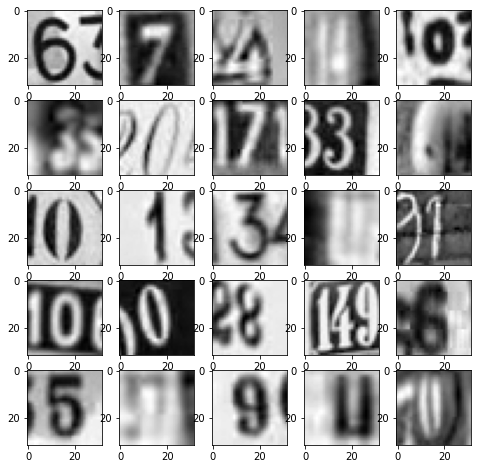

In [6]:
fig=plt.figure(figsize=(8,8))
columns=5
rows=5
for i in range(1, columns*rows+1):
    img=SVHN_X_trainData[i]
    fig.add_subplot(rows,columns,i)
    plt.imshow(img,cmap='gray')
plt.show()

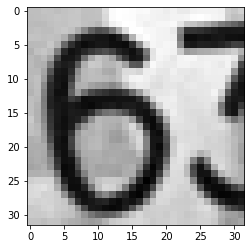

Label:  6


In [7]:
# show the number in the dataset
plt.imshow(SVHN_X_trainData[1],cmap='gray')    
plt.show()
print('Label: ', SVHN_Y_trainData[1])

In [8]:
#Reshape data from 2D to 1D -> 32X32 to 1024
SVHN_X_trainData = np.asarray(SVHN_X_trainData).reshape(42000,1024)
SVHN_X_valData = np.asarray(SVHN_X_valData).reshape(60000,1024)
SVHN_X_testData = np.asarray(SVHN_X_testData).reshape(18000,1024)

In [9]:
print(SVHN_X_trainData.shape)
print(SVHN_X_valData.shape)
print(SVHN_X_testData.shape)

(42000, 1024)
(60000, 1024)
(18000, 1024)


In [10]:
SVHN_Y_trainData = tf.keras.utils.to_categorical(SVHN_Y_trainData, num_classes=10)
SVHN_Y_testData = tf.keras.utils.to_categorical(SVHN_Y_testData, num_classes=10)
SVHN_Y_valData = tf.keras.utils.to_categorical(SVHN_Y_valData, num_classes=10)

In [11]:
print(SVHN_Y_trainData.shape)
print(SVHN_Y_testData.shape)
print(SVHN_Y_valData.shape)

(42000, 10)
(18000, 10)
(60000, 10)


#### Design, train, tune and test a neural network image classifier. 

###### Basic NN Model

In [12]:
model = Sequential()

# Input Layer
#Adding Input layer and activation functions ReLU
model.add(Dense(1024, input_shape = (1024, )))
model.add(Activation('relu'))

#Hidden Layer 1
#Adding 1st Hidden layer
model.add(Dense(512))
model.add(Activation('relu'))


#Hidden Layer 2
#Adding 2nd Hidden layer
model.add(Dense(256))
model.add(Activation('relu'))

#Hidden Layer 3
#Adding 3rd Hidden layer
model.add(Dense(128))
model.add(Activation('relu'))

#Hidden Layer 4
#Adding 4th Hidden layer
model.add(Dense(64))
model.add(Activation('relu'))


#Hidden Layer 4
#Adding 5th Hidden layer
model.add(Dense(32))
model.add(Activation('relu'))

#final layer with softmax
model.add(Dense(10))
model.add(Activation('softmax'))

In [13]:
sgd = optimizers.SGD(lr = 0.0001,momentum=0.9)
model.compile(optimizer = sgd, loss = 'categorical_crossentropy', metrics = ['accuracy'])
model.fit(SVHN_X_trainData, SVHN_Y_trainData,validation_data=(SVHN_X_valData,SVHN_Y_valData),  batch_size = 300, epochs = 10, verbose = 1)

D:\anaconda\envs\gl\lib\site-packages\tensorflow\python\keras\optimizer_v2\optimizer_v2.py:375: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")


Epoch 1/10
140/140 [==============================] - 13s 83ms/step - loss: 8.9691 - accuracy: 0.0985 - val_loss: 2.3026 - val_accuracy: 0.1000
Epoch 2/10
140/140 [==============================] - 10s 69ms/step - loss: 2.3026 - accuracy: 0.0995 - val_loss: 2.3026 - val_accuracy: 0.1000
Epoch 3/10
140/140 [==============================] - 11s 81ms/step - loss: 2.3026 - accuracy: 0.1020 - val_loss: 2.3026 - val_accuracy: 0.1000
Epoch 4/10
140/140 [==============================] - 11s 78ms/step - loss: 2.3026 - accuracy: 0.1020 - val_loss: 2.3026 - val_accuracy: 0.1000
Epoch 5/10
140/140 [==============================] - 11s 78ms/step - loss: 2.3025 - accuracy: 0.1020 - val_loss: 2.3026 - val_accuracy: 0.1000
Epoch 6/10
140/140 [==============================] - 10s 70ms/step - loss: 2.3025 - accuracy: 0.1020 - val_loss: 2.3025 - val_accuracy: 0.1000
Epoch 7/10
140/140 [==============================] - 11s 76ms/step - loss: 2.3025 - accuracy: 0.1020 - val_loss: 2.3026 - val_accuracy:

    The accuracy is not improving after few epochs, Other parameters can be changed to see if there is improvement in accuracy. Other neural network has to be checked for given data to improvise the accuracy. Several parameters needs to be changed as well.

In [14]:
adam = optimizers.Adam(learning_rate=0.0001, beta_1=0.9, beta_2=0.999, epsilon=1e-07, )
model.compile(optimizer = adam, loss = 'categorical_crossentropy', metrics = ['accuracy'])
model.fit(SVHN_X_trainData, SVHN_Y_trainData,validation_data=(SVHN_X_valData,SVHN_Y_valData),  batch_size = 300, epochs = 10, verbose = 1)

Epoch 1/10
140/140 [==============================] - 13s 85ms/step - loss: 2.3026 - accuracy: 0.1019 - val_loss: 2.3026 - val_accuracy: 0.1000
Epoch 2/10
140/140 [==============================] - 11s 78ms/step - loss: 2.3026 - accuracy: 0.1019 - val_loss: 2.3026 - val_accuracy: 0.1000
Epoch 3/10
140/140 [==============================] - 11s 81ms/step - loss: 2.3026 - accuracy: 0.1019 - val_loss: 2.3026 - val_accuracy: 0.1000
Epoch 4/10
140/140 [==============================] - 12s 83ms/step - loss: 2.3026 - accuracy: 0.1019 - val_loss: 2.3026 - val_accuracy: 0.1000
Epoch 5/10
140/140 [==============================] - 11s 81ms/step - loss: 2.3026 - accuracy: 0.1019 - val_loss: 2.3026 - val_accuracy: 0.1000
Epoch 6/10
140/140 [==============================] - 11s 80ms/step - loss: 2.3026 - accuracy: 0.1019 - val_loss: 2.3026 - val_accuracy: 0.1000
Epoch 7/10
140/140 [==============================] - 11s 80ms/step - loss: 2.3026 - accuracy: 0.1019 - val_loss: 2.3026 - val_accuracy:

    The same is observed in the above cell, wherein the accuracy is not improving. Kernel initialization can be implemented which could aid in improving accuracy.

#### Adding kernel initialization with relu activation.
    he_normal initialization works better for layers with ReLu activation.

In [15]:
##Initialize the Artificial Neural Network Classifier
keras_model_IRA = Sequential()

In [16]:
# Input Layer
#Adding Input layer and activation functions ReLU
keras_model_IRA.add(Dense(512, kernel_initializer='he_normal',input_shape = (1024, )))
#Adding Activation function
keras_model_IRA.add(Activation('relu'))

#Hidden Layer 1
#Adding 1st Hidden layer
keras_model_IRA.add(Dense(256, kernel_initializer='he_normal'))
#Adding Activation function
keras_model_IRA.add(Activation('relu'))

#Hidden Layer 2
#Adding 2nd Hidden layer
keras_model_IRA.add(Dense(128, kernel_initializer='he_normal'))
#Adding Activation function
keras_model_IRA.add(Activation('relu'))

#Hidden Layer 3
#Adding 3rd Hidden layer
keras_model_IRA.add(Dense(64, kernel_initializer='he_normal'))
#Adding Activation function
keras_model_IRA.add(Activation('relu'))

#Hidden Layer 4
#Adding 4th Hidden layer
keras_model_IRA.add(Dense(32, kernel_initializer='he_normal'))
#Adding Activation function
keras_model_IRA.add(Activation('relu'))

# Output Layer
#Adding output layer of 10 nodes, which corresponds to each digits
keras_model_IRA.add(Dense(10))
#Adding Activation function
# Here, we are using softmax function because we have multiclass classsification
keras_model_IRA.add(Activation('softmax'))

In [17]:
keras_model_IRA.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_7 (Dense)              (None, 512)               524800    
_________________________________________________________________
activation_7 (Activation)    (None, 512)               0         
_________________________________________________________________
dense_8 (Dense)              (None, 256)               131328    
_________________________________________________________________
activation_8 (Activation)    (None, 256)               0         
_________________________________________________________________
dense_9 (Dense)              (None, 128)               32896     
_________________________________________________________________
activation_9 (Activation)    (None, 128)               0         
_________________________________________________________________
dense_10 (Dense)             (None, 64)               

In [18]:
adam = optimizers.Adam(learning_rate=0.001, beta_1=0.7, beta_2=0.799, epsilon=1e-07 )
keras_model_IRA.compile(optimizer = adam, loss = 'categorical_crossentropy', metrics = ['accuracy'])
history = keras_model_IRA.fit(SVHN_X_trainData, SVHN_Y_trainData,validation_data=(SVHN_X_valData,SVHN_Y_valData),  batch_size = 300, epochs = 100, verbose = 1)

Epoch 1/100
140/140 [==============================] - 6s 35ms/step - loss: 7.7026 - accuracy: 0.0988 - val_loss: 2.3026 - val_accuracy: 0.1000
Epoch 2/100
140/140 [==============================] - 5s 34ms/step - loss: 2.3027 - accuracy: 0.1011 - val_loss: 2.3026 - val_accuracy: 0.1000
Epoch 3/100
140/140 [==============================] - 5s 33ms/step - loss: 2.3026 - accuracy: 0.1010 - val_loss: 2.3026 - val_accuracy: 0.1000
Epoch 4/100
140/140 [==============================] - 5s 35ms/step - loss: 2.3026 - accuracy: 0.1019 - val_loss: 2.3026 - val_accuracy: 0.1000
Epoch 5/100
140/140 [==============================] - 5s 34ms/step - loss: 2.3026 - accuracy: 0.1019 - val_loss: 2.3026 - val_accuracy: 0.1000
Epoch 6/100
140/140 [==============================] - 5s 36ms/step - loss: 2.3026 - accuracy: 0.1019 - val_loss: 2.3026 - val_accuracy: 0.1000
Epoch 7/100
140/140 [==============================] - 5s 35ms/step - loss: 2.3026 - accuracy: 0.1019 - val_loss: 2.3026 - val_accuracy:

    In above cell, adam optimizer has been used with learning rate of 0.001. Learning rate of 0.0001 with same beta values are tested and the learning is too slow and we got half the accuracy with same number of epochs. So it is better to have a balanced learning rate and the learning rate affects how quickly our model can converge to a local minima, arrive at best accuracy. It's is required to observe the Val_accuracy and accuracy.

In [19]:
# compiling the classifier
keras_model_IRA.compile(optimizer = 'sgd', loss = 'categorical_crossentropy', metrics = ['accuracy'])
# Fitting the Training data
keras_model_IRA.fit(SVHN_X_trainData, SVHN_Y_trainData, validation_data=(SVHN_X_valData,SVHN_Y_valData),batch_size = 300, epochs = 10, verbose = 1)

Epoch 1/10
140/140 [==============================] - 5s 34ms/step - loss: 2.3026 - accuracy: 0.1019 - val_loss: 2.3026 - val_accuracy: 0.1000
Epoch 2/10
140/140 [==============================] - 5s 32ms/step - loss: 2.3026 - accuracy: 0.1019 - val_loss: 2.3026 - val_accuracy: 0.1000
Epoch 3/10
140/140 [==============================] - 5s 33ms/step - loss: 2.3026 - accuracy: 0.1019 - val_loss: 2.3026 - val_accuracy: 0.1000
Epoch 4/10
140/140 [==============================] - 5s 33ms/step - loss: 2.3026 - accuracy: 0.1019 - val_loss: 2.3026 - val_accuracy: 0.1000
Epoch 5/10
140/140 [==============================] - 5s 33ms/step - loss: 2.3026 - accuracy: 0.1019 - val_loss: 2.3026 - val_accuracy: 0.1000
Epoch 6/10
140/140 [==============================] - 4s 32ms/step - loss: 2.3026 - accuracy: 0.1019 - val_loss: 2.3026 - val_accuracy: 0.1000
Epoch 7/10
140/140 [==============================] - 5s 33ms/step - loss: 2.3026 - accuracy: 0.1019 - val_loss: 2.3026 - val_accuracy: 0.1000

In [20]:
# compiling the classifier
adagrad = optimizers.Adagrad(lr = 0.001,initial_accumulator_value=0.1)
keras_model_IRA.compile(optimizer = adagrad, loss = 'categorical_crossentropy', metrics = ['accuracy'])
# Fitting the Training data
keras_model_IRA.fit(SVHN_X_trainData, SVHN_Y_trainData,validation_data=(SVHN_X_valData,SVHN_Y_valData),  batch_size = 300, epochs = 20, verbose = 1)

Epoch 1/20
140/140 [==============================] - 6s 36ms/step - loss: 2.3026 - accuracy: 0.1019 - val_loss: 2.3026 - val_accuracy: 0.1000
Epoch 2/20
140/140 [==============================] - 5s 36ms/step - loss: 2.3026 - accuracy: 0.1019 - val_loss: 2.3026 - val_accuracy: 0.1000
Epoch 3/20
140/140 [==============================] - 5s 35ms/step - loss: 2.3026 - accuracy: 0.1019 - val_loss: 2.3026 - val_accuracy: 0.1000
Epoch 4/20
140/140 [==============================] - 5s 34ms/step - loss: 2.3026 - accuracy: 0.1019 - val_loss: 2.3026 - val_accuracy: 0.1000
Epoch 5/20
140/140 [==============================] - 5s 35ms/step - loss: 2.3026 - accuracy: 0.1019 - val_loss: 2.3026 - val_accuracy: 0.1000
Epoch 6/20
140/140 [==============================] - 5s 34ms/step - loss: 2.3026 - accuracy: 0.1019 - val_loss: 2.3026 - val_accuracy: 0.1000
Epoch 7/20
140/140 [==============================] - 5s 34ms/step - loss: 2.3026 - accuracy: 0.1019 - val_loss: 2.3026 - val_accuracy: 0.1000

    In above cell, we are checking with different optimizers, sgd and Adagrad are providing good accuracy score. We can have adam as optimizer. For SGD and Adagrad, other parameters can be changed and checked, but observing score it is better to have adam optimizer.

    The plot is for the network with name keras_model_IRA. This model is having 4 hidden layer and relu activation with he_normal kernel initialization.

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


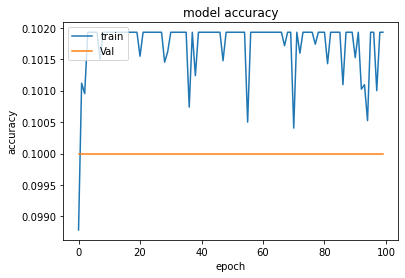

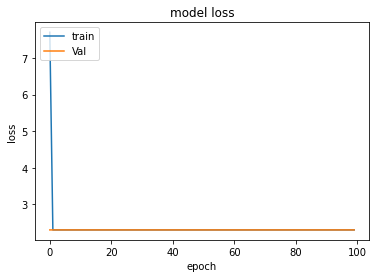

In [21]:
# list all data in history
print(history.history.keys())

# summarize history for accuracy
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'Val'], loc='upper left')
plt.show()

# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'Val'], loc='upper left')
plt.show()

    There is no improvement in accuracy and the model needs lot of improvisation, either by adding layer or by tuning parameters !!!
    This represents some underfit model as the gap between 2 losses are too much, This model needs improvisation.

#### adding batch normalization in between layers with adagrad optimizer

In [22]:
def mlp_model():
    model = Sequential()
    
    model.add(Dense(1024, input_shape = (1024, )))
    model.add(BatchNormalization())                    
    model.add(Activation('relu'))    
    model.add(Dense(512))
    model.add(BatchNormalization())                    
    model.add(Activation('relu'))    
    model.add(Dense(128))
    model.add(BatchNormalization())                    
    model.add(Activation('relu'))    
    model.add(Dense(64))
    model.add(BatchNormalization())                    
    model.add(Activation('relu'))    
    model.add(Dense(10))
    model.add(Activation('softmax'))
    
    adagrad = optimizers.Adagrad(lr = 0.001)
    model.compile(optimizer = adagrad, loss = 'categorical_crossentropy', metrics = ['accuracy'])
     
    return model

In [23]:
#applying early stopping since after around 80 % of accuracy, there are no improvements observed.
es = EarlyStopping(monitor='val_accuracy', mode='max', verbose=1, patience=5)
# history5 = model.fit(SVHN_X_trainData, SVHN_Y_trainData,validation_data=(SVHN_X_valData,SVHN_Y_valData), validation_split=0.25, epochs = 50, verbose = 1, callbacks=[es])

model = mlp_model()
# history = model.fit(SVHN_X_trainData, SVHN_Y_trainData,validation_data=(SVHN_X_valData,SVHN_Y_valData),batch_size = 200, epochs = 100, verbose = 1)
history = model.fit(SVHN_X_trainData, SVHN_Y_trainData,validation_data=(SVHN_X_valData,SVHN_Y_valData), epochs = 20, verbose = 1, callbacks=[es])

Epoch 1/20
1313/1313 [==============================] - 46s 34ms/step - loss: 1.8937 - accuracy: 0.3636 - val_loss: 1.4849 - val_accuracy: 0.5419
Epoch 2/20
1313/1313 [==============================] - 41s 31ms/step - loss: 1.3936 - accuracy: 0.5713 - val_loss: 1.2198 - val_accuracy: 0.6399
Epoch 3/20
1313/1313 [==============================] - 41s 31ms/step - loss: 1.2111 - accuracy: 0.6338 - val_loss: 1.0633 - val_accuracy: 0.6919
Epoch 4/20
1313/1313 [==============================] - 37s 28ms/step - loss: 1.0995 - accuracy: 0.6720 - val_loss: 0.9643 - val_accuracy: 0.7246
Epoch 5/20
1313/1313 [==============================] - 39s 30ms/step - loss: 1.0234 - accuracy: 0.6930 - val_loss: 0.8931 - val_accuracy: 0.7460
Epoch 6/20
1313/1313 [==============================] - 40s 30ms/step - loss: 0.9670 - accuracy: 0.7101 - val_loss: 0.8290 - val_accuracy: 0.7645
Epoch 7/20
1313/1313 [==============================] - 39s 30ms/step - loss: 0.9111 - accuracy: 0.7284 - val_loss: 0.8237 -

    In above model we have used Adagrad optimizer with batch normalization, the network is trained with learning rate of 0.001. For each epoch, the model is taking around 40 seconds. We can use other optimizers and check if this can be improved. Early stopping has been introduced to avoid overfitting and stop the model at appropriate training point.

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


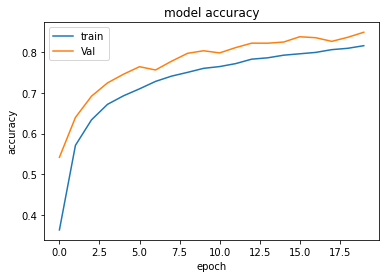

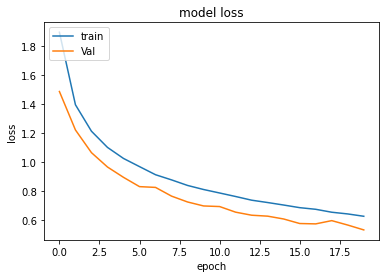

In [24]:

# list all data in history
print(history.history.keys())

# summarize history for accuracy
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'Val'], loc='upper left')
plt.show()

# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'Val'], loc='upper left')
plt.show()

    Here validation loss is lower than the training one. In this case, it indicates that the validation dataset may be easier for the model to predict than the training dataset. We can increase epoch and run the model again, but it is always better to add batch normalization and check how we can achieve better convergence.
    
    As observed in above graphs, we are arriving at good accuracy and less loss as number of epochs increases. These can be improved by using other optimizers and adding batch normalization layer. 
    
    AdaGrad uses the second moment with no decay to deal with sparse features. RMSProp uses the second moment by with a decay rate to speed up from AdaGrad. Adam uses both first and second moments, and is generally the best choice.
    
    reference : https://towardsdatascience.com/a-visual-explanation-of-gradient-descent-methods-momentum-adagrad-rmsprop-adam-f898b102325c

#### Using Batch Normalization with kernel initialization with relu activation.

In [25]:
##Initialize the Artificial Neural Network Classifier
##Batch Normalization, Initialization, relu and Adam
keras_model_BIRA = Sequential()

# Input Layer
#Adding Input layer and activation functions ReLU
keras_model_BIRA.add(Dense(512, kernel_initializer='he_normal',input_shape = (1024, )))
#adding batch normalization layer in between
keras_model_BIRA.add(BatchNormalization())        
#Adding Activation function
keras_model_BIRA.add(Activation('relu'))

#Hidden Layer 1
#Adding first Hidden layer
keras_model_BIRA.add(Dense(256, kernel_initializer='he_normal'))
#adding batch normalization layer in between
keras_model_BIRA.add(BatchNormalization())        
#Adding Activation function
keras_model_BIRA.add(Activation('relu'))

#Hidden Layer 2
#Adding second Hidden layer
keras_model_BIRA.add(Dense(128, kernel_initializer='he_normal'))
#adding batch normalization layer in between
keras_model_BIRA.add(BatchNormalization())        
#Adding Activation function
keras_model_BIRA.add(Activation('relu'))

#Hidden Layer 3
#Adding third Hidden layer
keras_model_BIRA.add(Dense(64, kernel_initializer='he_normal'))
#adding batch normalization layer in between
keras_model_BIRA.add(BatchNormalization())        
#Adding Activation function
keras_model_BIRA.add(Activation('relu'))

#Hidden Layer 4
#Adding fourth Hidden layer
keras_model_BIRA.add(Dense(32, kernel_initializer='he_normal'))
#adding batch normalization layer in between
keras_model_BIRA.add(BatchNormalization())        
#Adding Activation function
keras_model_BIRA.add(Activation('relu'))

# Output Layer
#Adding output layer which is of 10 nodes (digits)
keras_model_BIRA.add(Dense(10))
#Adding Activation function
# Here, we are using softmax function because we have multiclass classsification
keras_model_BIRA.add(Activation('softmax'))


keras_model_BIRA.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_18 (Dense)             (None, 512)               524800    
_________________________________________________________________
batch_normalization_4 (Batch (None, 512)               2048      
_________________________________________________________________
activation_18 (Activation)   (None, 512)               0         
_________________________________________________________________
dense_19 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_5 (Batch (None, 256)               1024      
_________________________________________________________________
activation_19 (Activation)   (None, 256)               0         
_________________________________________________________________
dense_20 (Dense)             (None, 128)              

In [26]:
# es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=2)
es = EarlyStopping(monitor='val_accuracy', mode='max', verbose=1, patience=5)
adam = optimizers.Adam(learning_rate=0.0001, beta_1=0.9, beta_2=0.999, epsilon=1e-07 )
# compiling the classifier
keras_model_BIRA.compile(optimizer = adam, loss = 'categorical_crossentropy', metrics = ['accuracy'])
# Fitting Training data
history = keras_model_BIRA.fit(SVHN_X_trainData, SVHN_Y_trainData, validation_data=(SVHN_X_valData,SVHN_Y_valData),batch_size = 300, epochs = 25, verbose = 1, callbacks=[es])

Epoch 1/25
140/140 [==============================] - 8s 41ms/step - loss: 2.1752 - accuracy: 0.2174 - val_loss: 2.1112 - val_accuracy: 0.2486
Epoch 2/25
140/140 [==============================] - 5s 39ms/step - loss: 1.6567 - accuracy: 0.4752 - val_loss: 1.6823 - val_accuracy: 0.4610
Epoch 3/25
140/140 [==============================] - 6s 41ms/step - loss: 1.3642 - accuracy: 0.6082 - val_loss: 1.4298 - val_accuracy: 0.5653
Epoch 4/25
140/140 [==============================] - 6s 40ms/step - loss: 1.1782 - accuracy: 0.6727 - val_loss: 1.2374 - val_accuracy: 0.6489
Epoch 5/25
140/140 [==============================] - 6s 40ms/step - loss: 1.0394 - accuracy: 0.7176 - val_loss: 1.1638 - val_accuracy: 0.6617
Epoch 6/25
140/140 [==============================] - 6s 40ms/step - loss: 0.9333 - accuracy: 0.7458 - val_loss: 1.0232 - val_accuracy: 0.7063
Epoch 7/25
140/140 [==============================] - 6s 46ms/step - loss: 0.8475 - accuracy: 0.7663 - val_loss: 0.9716 - val_accuracy: 0.7288

    By Observing the accuracy and Val_accuracy, there be 

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


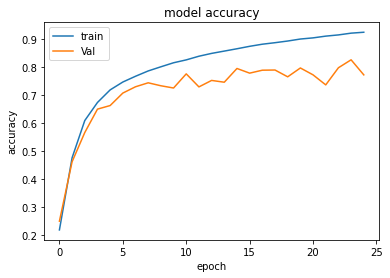

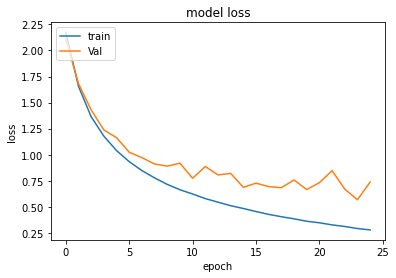

In [27]:

# list all data in history
print(history.history.keys())

# summarize history for accuracy
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'Val'], loc='upper left')
plt.show()

# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'Val'], loc='upper left')
plt.show()

    The generalisation gap between the losses are widening. It looks like a case of overfitting. So as to avoid this let's try drop out layer and see how the model converges.

#### Using Batch Normalization with kernel initialization with relu activation and adding dropout 
    This is to check if we are getting any increase in accuracy.

In [28]:
##Initialize the Artificial Neural Network Classifier
keras_model_BIRAD = Sequential()
dropout_val = 0.25
# Input Layer
#Adding Input layer and activation functions ReLU
keras_model_BIRAD.add(Dense(512, kernel_initializer='he_normal',input_shape = (1024, )))
#Adding BatchNormalization Layer
keras_model_BIRAD.add(BatchNormalization())
#Adding Activation function
keras_model_BIRAD.add(Activation('relu'))
#Adding Dropout Layer
keras_model_BIRAD.add(Dropout(dropout_val))

#Hidden Layer 1
#Adding first Hidden layer
keras_model_BIRAD.add(Dense(256,kernel_initializer='he_normal'))
#Adding BatchNormalization Layer
keras_model_BIRAD.add(BatchNormalization())
#Adding Activation function
keras_model_BIRAD.add(Activation('relu'))
#Adding Dropout Layer
keras_model_BIRAD.add(Dropout(dropout_val))

#Hidden Layer 2
#Adding second Hidden layer
keras_model_BIRAD.add(Dense(128, kernel_initializer='he_normal'))
#Adding BatchNormalization Layer
keras_model_BIRAD.add(BatchNormalization())
#Adding Activation function
keras_model_BIRAD.add(Activation('relu'))
#Adding Dropout Layer
keras_model_BIRAD.add(Dropout(dropout_val))

#Hidden Layer 3
#Adding third Hidden layer
keras_model_BIRAD.add(Dense(64, kernel_initializer='he_normal'))
#Adding BatchNormalization Layer
keras_model_BIRAD.add(BatchNormalization())
#Adding Activation function
keras_model_BIRAD.add(Activation('relu'))
#Adding Dropout Layer
keras_model_BIRAD.add(Dropout(dropout_val))

#Hidden Layer 4
#Adding fourth Hidden layer
keras_model_BIRAD.add(Dense(32, kernel_initializer='he_normal'))
#Adding BatchNormalization Layer
keras_model_BIRAD.add(BatchNormalization())
#Adding Activation function
keras_model_BIRAD.add(Activation('relu'))
#Adding Dropout Layer
keras_model_BIRAD.add(Dropout(dropout_val))

# Output Layer
#Adding output layer which is of 10 nodes (digidts)
keras_model_BIRAD.add(Dense(10))
#Adding Activation function
# Here, we are using softmax function because we have multiclass classsification
keras_model_BIRAD.add(Activation('softmax'))



In [29]:

keras_model_BIRAD.summary()


Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_24 (Dense)             (None, 512)               524800    
_________________________________________________________________
batch_normalization_9 (Batch (None, 512)               2048      
_________________________________________________________________
activation_24 (Activation)   (None, 512)               0         
_________________________________________________________________
dropout (Dropout)            (None, 512)               0         
_________________________________________________________________
dense_25 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_10 (Batc (None, 256)               1024      
_________________________________________________________________
activation_25 (Activation)   (None, 256)              

In [30]:
# adam = optimizers.Adam(learning_rate=0.0001, beta_1=0.9, beta_2=0.999, epsilon=1e-07 )
# # compiling the classifier
# keras_model_BIRA.compile(optimizer = adam, loss = 'categorical_crossentropy', metrics = ['accuracy'])
# # Fitting Training data
# history = keras_model_BIRA.fit(SVHN_X_trainData, SVHN_Y_trainData, validation_data=(SVHN_X_valData,SVHN_Y_valData),batch_size = 300, epochs = 25, verbose = 1, callbacks=[es])

In [31]:
# es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=2)
es = EarlyStopping(monitor='val_accuracy', mode='max', verbose=1, patience=5)

#Setting the learning rate in adam
adam = optimizers.Adam(learning_rate = 0.001)
# compiling the ANN classifier
keras_model_BIRAD.compile(optimizer = adam, loss = 'categorical_crossentropy', metrics = ['accuracy'])

In [32]:
# Fitting the ANN to the Training data
history_BIRAD = keras_model_BIRAD.fit(
    SVHN_X_trainData
    , SVHN_Y_trainData
    , validation_data=(SVHN_X_valData,SVHN_Y_valData)
    , batch_size = 320
    , epochs = 100
    , verbose = 1
#     , callbacks=[es]
)
history = history_BIRAD

Epoch 1/100
132/132 [==============================] - 9s 50ms/step - loss: 2.3419 - accuracy: 0.1546 - val_loss: 2.0902 - val_accuracy: 0.2253
Epoch 2/100
132/132 [==============================] - 6s 46ms/step - loss: 1.8400 - accuracy: 0.3402 - val_loss: 1.7038 - val_accuracy: 0.4040
Epoch 3/100
132/132 [==============================] - 6s 47ms/step - loss: 1.5052 - accuracy: 0.4773 - val_loss: 1.7268 - val_accuracy: 0.4083
Epoch 4/100
132/132 [==============================] - 6s 46ms/step - loss: 1.3240 - accuracy: 0.5524 - val_loss: 1.8936 - val_accuracy: 0.4047
Epoch 5/100
132/132 [==============================] - 6s 47ms/step - loss: 1.2062 - accuracy: 0.6021 - val_loss: 1.3370 - val_accuracy: 0.5502
Epoch 6/100
132/132 [==============================] - 6s 46ms/step - loss: 1.1053 - accuracy: 0.6404 - val_loss: 1.4082 - val_accuracy: 0.5495
Epoch 7/100
132/132 [==============================] - 6s 48ms/step - loss: 1.0310 - accuracy: 0.6733 - val_loss: 1.1462 - val_accuracy:

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


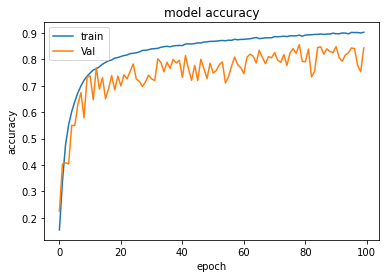

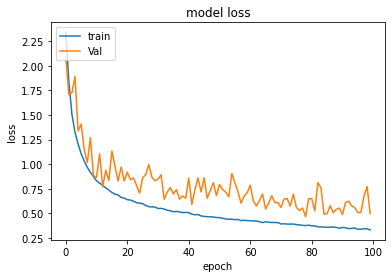

In [33]:

# list all data in history
print(history.history.keys())

# summarize history for accuracy
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'Val'], loc='upper left')
plt.show()

# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'Val'], loc='upper left')
plt.show()

    The loss and accuracy against epoch gives good insight into network behaviour, it provides changes in learning performance over time in terms of experience.. The lower the loss, the better a model. No large deviation observed between train and validation data. 
    The same model is also tried with adagrad optimizer, but there were no significant improvement observed in the accuracy.
    The generalization gap is not so much and model convergence is happenin as expected. we could increase number of epoch and see how it improvises. But for now let's evaluate the model for test data and see check the accuracy.

In [34]:
results_BIRDA = keras_model_BIRAD.evaluate(SVHN_X_testData,SVHN_Y_testData)
print('Val_acc using BatchNorm and Dropout adam : ', results_BIRDA[1])

563/563 [==============================] - 3s 5ms/step - loss: 0.6368 - accuracy: 0.8001
Val_acc using BatchNorm and Dropout adam :  0.8001111149787903


    The model is having good accuracy, so let's check the output on test data and compare it with real data

9


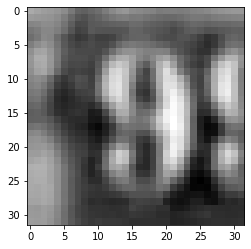

In [35]:
#Showing the image
plt.imshow(SVHN_X_testData[5].reshape(32,32),cmap='gray')
dt = SVHNRawData['y_test']
print(dt[5])

In [36]:
#Predicting the digits
keras_model_BIRAD.predict_classes(SVHN_X_testData)[5]

D:\anaconda\envs\gl\lib\site-packages\tensorflow\python\keras\engine\sequential.py:455: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


9

2


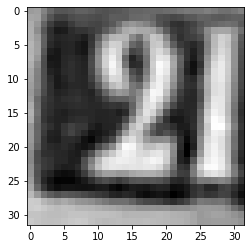

In [37]:
#Showing the image
plt.imshow(SVHN_X_testData[25].reshape(32,32),cmap='gray')
print(dt[25])

In [38]:
#Predicting the digits
keras_model_BIRAD.predict_classes(SVHN_X_testData)[25]

2

1


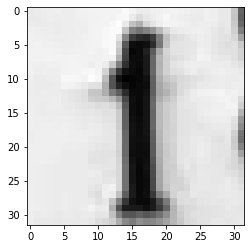

In [39]:
#Showing the image
plt.imshow(SVHN_X_testData[110].reshape(32,32),cmap='gray')
print(dt[110])

In [40]:
#Predicting the digits
keras_model_BIRAD.predict_classes(SVHN_X_testData)[110]

1

**Observation**:

    It is better to use dense network with 3 or 4 hidden layers. In this experiment, it is observed that the accuracy score is good when he_normal kernal_initialization is used with relu. Adding drop out has also helped to improved network accuracy.
    Using Batch Normalization has helped to improve the accuracy. It has standardize the inputs to a network, applied to ether the activations of a prior layer. Batch normalization has accelerated training and provided some regularization, there by reducing generalization error.
    Initializing random weights through kernal_initialization has improved the network performance a lot. It is also observed that these techiniques has stabilised the network.
    We used the predict_classes on some random images which has given right output, this gives confidence on he network which is built and trained.
    We tried different optimizers (SGD, adam) on simple network but it was unable to improve accuracy and very struck at one minima and hence accuracy was also stagnant. We improved the network by adding few layers with some weight initialization which has helped to get better accuracy and upon applying different optimizers it help to get better accuracy. By adding batch normalization and dropout, we got better result.
    
